# Setup

In [1]:
import inspect
from itertools import chain
import os
import re
import subprocess

from fuzzywuzzy import fuzz
import javalang.javalang as javalang
from javalang.javalang.ast import Node
from javalang.javalang.parser import JavaSyntaxError, JavaParserError
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd
from pyvis.network import Network

# folder path
path = '../../kestra/'

size_metrics_df = {
    'folder': [],
    'file': [],
    'file_size': [],
    'file_line_cnt': [],
    'code_tokens': [],
    'comment_tokens': [],
    'file_token_cnt': [],
    'declared_classes': [],
    'dc_code_tokens': [],
    'dc_comment_tokens': [],
    'declared_methods': [],
    'dm_code_tokens': [],
    'dm_comment_tokens': [],
    'parser': [],
}

file_ignore_list = ['.DS_Store', '.ico', '.png']

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


# Parsing

## Functions

In [2]:
def parse_file_metrics_jl(content):
    global tokens
    tokens = list(javalang.tokenizer.tokenize(content))
    file_token_count = len(tokens)

    return file_token_count, tokens


def parse_class_method_metrics_jl(content):
    global tree
    tree = javalang.parse.parse(content)

    class_list, method_list = [], []
    
    for path, node in tree:
        if isinstance(node, javalang.tree.ClassDeclaration):
            class_list.append(node)

        elif isinstance(node, javalang.tree.MethodDeclaration) or isinstance(node, javalang.tree.ConstructorDeclaration):
            method_list.append(node)

    return (class_list, method_list)

def count_tokens_in_scope(tokens, scopes):
    scope_counts = []

    for scope in scopes:
        start_pos = scope.position
        token_count = 0 # assume scope starts on its own line OR len(modifiers) and figure out how to incorporate return type
        stack = []
        in_scope = False

        for token in tokens:
            if token.position.line >= start_pos.line and\
                token.position.column >= 0: # assume scope starts on its own line OR start_pos.column:
                
                if token.value == '{':
                    stack.append('{')
                    # in_scope = True
                
                elif token.value == '}':
                    # if in_scope:
                    stack.pop()
                    token_count += 1 # include last token
                    if not stack:
                        break
                
                token_count += 1

        scope_counts.append(token_count)

    return scope_counts


def count_tokens_in_java_re(content):
    # Define a regex pattern to match Java tokens including string literals.
    token_pattern = re.compile(r'\b\w+\b|->|[\+\-\*\/\%\=\!\&\|\>\<\;\:\[\]\{\}\(\)\.\,\@]|\"[\s\S]*?\"|\'[\s\S]*?\'')
    code_token_count = 0
    comment_token_count = 0
    
    # Extracting and counting tokens in single line comments
    single_line_comments = re.findall(r'\/\/[^\n]*', content)
    for comment in single_line_comments:
        comment_tokens = token_pattern.findall(comment)
        comment_token_count += len(comment_tokens)
    # Extracting and counting tokens in multi-line comments
    multi_line_comments = re.findall(r'\/\*[\s\S]*?\*\/', content)
    for comment in multi_line_comments:
        comment_tokens = token_pattern.findall(comment)
        comment_token_count += len(comment_tokens)
        
    content = re.sub(r'\/\/[^\n]*', '', content)  # Removing single line comments
    content = re.sub(r'\/\*[\s\S]*?\*\/', '', content)  # Removing multi-line comments

    code_tokens = token_pattern.findall(content)
    code_token_count = len(code_tokens)
        
    return code_token_count, comment_token_count

def extract_classes_and_methods_re(content):
    classes = re.findall(r'class (\w+)', content)
    methods = re.findall(r'(public|protected|private|static|\s) +[\w\<\>\[\]]+\s+(\w+) *\([^\)]*\) *{?', content)
    method_names = [method[1] for method in methods]# if method[1] not in classes]
    # methods = re.findall(r'\S+\(.*\).+\{', content)
    # method_names = [re.sub(r'\(.+', '', method) for method in methods]
    return classes, method_names
    

def count_class_tokens_by_type(classes, content):
    class_code_tokens = []
    class_comment_tokens = []

    for clazz in classes:
        match = re.search(f"{clazz}([^\}}]*)\}}", content)
        substring = match.group(1)
        code_tokens, comment_tokens = count_tokens_in_java_re(substring)
        class_code_tokens.append(code_tokens)
        class_comment_tokens.append(comment_tokens)
    
    return class_code_tokens, class_comment_tokens

def count_method_tokens_by_type(methods, content):
    method_code_tokens = []
    method_comment_tokens = []

    for method in methods:
        match = re.search(f"{method}([^\}}]*)\}}", content)
        substring = match.group(1)
        code_tokens, comment_tokens = count_tokens_in_java_re(substring)
        method_code_tokens.append(code_tokens)
        method_comment_tokens.append(comment_tokens)

    return method_code_tokens, method_comment_tokens

## Parse Files

In [3]:
tree = None
tokens = None
i = 0
n_files = 999999
for root, dirs, files in os.walk(path):
    for file_name in files:
        # if any(map(file.__contains__, file_ignore_list)):
        #     continue

        # stick to java files for now
        if '.java' not in file_name:
            continue

        if i > n_files:
            break
        i += 1
            
        file_path = os.path.join(root, file_name)
        file_size = os.path.getsize(file_path) /(1024 ** 3) # in GB

        # open the file
        try:
            with open(file_path, 'r', encoding='utf-8') as file:
                # print(file_path)
                content = file.read()
                lines = content.splitlines()
                line_count = len(lines)

                # count tokens in the file
                code_tokens, comment_tokens = 0, 0
                total_tokens, tokens = parse_file_metrics_jl(content)
                
                # for each class and method in the file calculate the name, line length, token length
                classes, methods = parse_class_method_metrics_jl(content)
                
                
                class_code_tokens = count_tokens_in_scope(tokens, classes)
                class_comment_tokens = [0] * len(classes)
                classes = [class_.name for class_ in classes]
                
                method_code_tokens = count_tokens_in_scope(tokens, methods)
                method_comment_tokens = [0] * len(methods)
                methods = [method.name for method in methods]

                parser = 'javalang' 

        except FileNotFoundError:
            print(f"File '{file_path}' not found.")
            continue

        except UnicodeDecodeError:
            print(f"File '{file_path}' unicode decode error.")
            continue
    
        except Exception as e:
            print(f"File '{file_path}' exception: {e}")
            code_tokens, comment_tokens = count_tokens_in_java_re(content)
            total_tokens = code_tokens + comment_tokens
            classes, methods = extract_classes_and_methods_re(content)
            class_code_tokens, class_comment_tokens = count_class_tokens_by_type(classes, content)
            method_code_tokens, method_comment_tokens = count_method_tokens_by_type(methods, content)
            parser = 'regex'


        size_metrics_df['folder'].append(root)
        size_metrics_df['file'].append(file_name)
        size_metrics_df['file_size'].append(file_size)
        size_metrics_df['file_line_cnt'].append(line_count)
        size_metrics_df['code_tokens'].append(code_tokens)
        size_metrics_df['comment_tokens'].append(comment_tokens)
        size_metrics_df['file_token_cnt'].append(total_tokens)
        size_metrics_df['declared_classes'].append(classes)
        size_metrics_df['dc_code_tokens'].append(class_code_tokens)
        size_metrics_df['dc_comment_tokens'].append(class_comment_tokens)
        size_metrics_df['declared_methods'].append(methods)
        size_metrics_df['dm_code_tokens'].append(method_code_tokens)
        size_metrics_df['dm_comment_tokens'].append(method_comment_tokens)
        size_metrics_df['parser'].append(parser)



File '../../kestra/jdbc-h2/src/test/java/io/kestra/runner/h2/H2FunctionsTest.java' exception: 
File '../../kestra/jdbc-h2/src/main/java/io/kestra/runner/h2/H2Functions.java' exception: 
File '../../kestra/jdbc-h2/src/main/java/io/kestra/runner/h2/H2Queue.java' exception: 
File '../../kestra/core/src/test/java/io/kestra/core/runners/WorkerTaskRunningTest.java' exception: 
File '../../kestra/core/src/test/java/io/kestra/core/runners/WorkerTaskTest.java' exception: Could not process token at "\", line 17: "value": "{\\"date\\":\\"2023-06-19T17:00:00Z\\",\\"title\\":\\"La_Rivière_rouge\\",\\"views\\":141}",
File '../../kestra/core/src/main/java/io/kestra/core/metrics/GlobalTagsConfigurer.java' exception: 
File '../../kestra/core/src/main/java/io/kestra/core/storages/StorageSplitInterface.java' exception: pop from empty list
File '../../kestra/core/src/main/java/io/kestra/core/storages/ImmutableFileAttributes.java' exception: 
File '../../kestra/core/src/main/java/io/kestra/core/tasks/stora

## Results

In [4]:
size_metrics_df = pd.DataFrame(size_metrics_df)
print(size_metrics_df.shape)
size_metrics_df.head(20)

(880, 14)


,folder,file,file_size,file_line_cnt,code_tokens,comment_tokens,file_token_cnt,declared_classes,dc_code_tokens,dc_comment_tokens,declared_methods,dm_code_tokens,dm_comment_tokens,parser
0,../../kestra/jdbc-h2/src/test/java/io/kestra/r...,H2ExecutionServiceTest.java,5.029142e-07,20,0,0,97,[H2ExecutionServiceTest],[37],[0],[init],[23],[0],javalang
1,../../kestra/jdbc-h2/src/test/java/io/kestra/r...,H2LogRepositoryTest.java,1.629815e-07,7,0,0,27,[H2LogRepositoryTest],[7],[0],[],[],[],javalang
2,../../kestra/jdbc-h2/src/test/java/io/kestra/r...,H2ExecutionRepositoryTest.java,4.125759e-07,24,0,0,71,[H2ExecutionRepositoryTest],[43],[0],"[mappingConflict, findTaskRun, taskRunsDailySt...","[7, 7, 7]","[0, 0, 0]",javalang
3,../../kestra/jdbc-h2/src/test/java/io/kestra/r...,H2MetricRepositoryTest.java,1.704320e-07,6,0,0,27,[H2MetricRepositoryTest],[7],[0],[],[],[],javalang
4,../../kestra/jdbc-h2/src/test/java/io/kestra/r...,H2SettingRepositoryTest.java,1.741573e-07,7,0,0,27,[H2SettingRepositoryTest],[7],[0],[],[],[],javalang
5,../../kestra/jdbc-h2/src/test/java/io/kestra/r...,H2TriggerRepositoryTest.java,1.741573e-07,7,0,0,27,[H2TriggerRepositoryTest],[7],[0],[],[],[],javalang
6,../../kestra/jdbc-h2/src/test/java/io/kestra/r...,H2lFlowRepositoryTest.java,6.388873e-07,23,0,0,88,[H2lFlowRepositoryTest],[45],[0],"[setup, init]","[7, 23]","[0, 0]",javalang
7,../../kestra/jdbc-h2/src/test/java/io/kestra/r...,H2WorkerInstanceRepositoryTest.java,1.927838e-07,6,0,0,27,[H2WorkerInstanceRepositoryTest],[7],[0],[],[],[],javalang
8,../../kestra/jdbc-h2/src/test/java/io/kestra/r...,H2FlowTopologyRepositoryTest.java,1.890585e-07,8,0,0,27,[H2FlowTopologyRepositoryTest],[7],[0],[],[],[],javalang
9,../../kestra/jdbc-h2/src/test/java/io/kestra/r...,H2TemplateRepositoryTest.java,3.287569e-07,10,0,0,62,[H2TemplateRepositoryTest],[7],[0],[],[],[],javalang


In [5]:
size_metrics_df.to_csv('../data/repository_analytics/size_metrics.csv')

# Test Coverage

## Exact Matching

In [6]:
size_metrics_df = pd.read_csv('../data/repository_analytics/size_metrics.csv')

In [7]:
def calculate_test_coverage(files):
    non_test_files = set()
    test_files = set()

    for file in files:
        if "test" not in file.lower():
            non_test_files.add(file)
        else:
            test_files.add((file, re.sub(r'test|Test|TEST', '', file)))
            
    files_without_test = non_test_files - {file[1] for file in test_files}
    
    # check IF sanitized unit test file names have match in non test files
    files_with_test = set()
    tests_without_file = set()
    for file_tuple in test_files:
        if file_tuple[1] in non_test_files:
            # create tuple with normal file name and unit test file name
            files_with_test.add((file_tuple[1], file_tuple[0]))
        else: 
            tests_without_file.add(file_tuple[0])

    return files_without_test, files_with_test, tests_without_file


In [8]:
test_coverage_results = calculate_test_coverage(size_metrics_df['file'].tolist())
print([len(file_set) for file_set in test_coverage_results]) # TODO fuzzy matching between sets 0 and 2

[405, 191, 74]


## Fuzzy Matching

In [9]:
def fuzzy_match_files(set1, set2, threshold=70):
    matched_pairs = []

    for file1 in set1:
        for file2 in set2:
            similarity_score = fuzz.ratio(file1, file2)
            if similarity_score >= threshold:
                matched_pairs.append((file1, file2, similarity_score))
    
    matched_pairs_df = pd.DataFrame(matched_pairs, columns=['file', 'test_file', 'score'])
    return matched_pairs_df

set1 = test_coverage_results[0]
set2 = test_coverage_results[2]

matched_pairs_df = fuzzy_match_files(set1, set2)

In [10]:
matched_pairs_df.sort_values('score', ascending=False, inplace=True)
matched_pairs_df.reset_index(inplace=True, drop='index')
matched_pairs_df['keep'] = 1

for index, row in matched_pairs_df.iterrows():
    if row['keep'] != 0:
        file_name = row['file']
        test_file_name = row['test_file']

        matched_pairs_df.loc[(matched_pairs_df['file'] == file_name)&(matched_pairs_df.index > index), 'keep'] = 0
        matched_pairs_df.loc[(matched_pairs_df['test_file'] == test_file_name)&(matched_pairs_df.index > index), 'keep'] = 0

print(matched_pairs_df['keep'].sum())
matched_pairs_df

40


,file,test_file,score,keep
0,ScheduleCondition.java,SchedulerConditionTest.java,90,1
1,AbstractJdbcMultipleConditionStorage.java,AbstractMultipleConditionStorageTest.java,90,1
2,H2FlowRepository.java,H2lFlowRepositoryTest.java,89,1
3,AbstractJdbcExecutionDelayStorage.java,AbstractJdbcExecutorStateStorage.java,85,1
4,AbstractJdbcWorkerTaskExecutionStorage.java,AbstractWorkerTaskExecutionTest.java,84,1
...,...,...,...,...
153,AbstractJdbcExecutionDelayStorage.java,AbstractExecutionServiceTest.java,70,0
154,MemoryLogRepository.java,AbstractLogRepositoryTest.java,70,0
155,TriggerContext.java,FlowTriggerCaseTest.java,70,0
156,JdbcSchedulerTriggerState.java,SchedulerThreadTest.java,70,0


In [11]:
for index, row in matched_pairs_df.iterrows():
    if row['keep']==1:
        test_coverage_results[1].add((row['file'], row['test_file']))
        test_coverage_results[0].remove(row['file'])
        test_coverage_results[2].remove(row['test_file'])
print([len(file_set) for file_set in test_coverage_results])

[365, 231, 34]


In [12]:
print(f"File test coverage percentage: {len(test_coverage_results[1]) / (len(test_coverage_results[0]) + len(test_coverage_results[1]))}")

File test coverage percentage: 0.3875838926174497


# Graph of Class References

In [13]:
declared_classes = size_metrics_df['declared_classes'].tolist()
declared_classes = list(chain(*declared_classes))
declared_classes = set(declared_classes)


In [14]:


# Function to extract class declarations and class references from a Java file
def extract_class_declarations_and_references(file_path):
    class_declarations = set()
    class_references = set()
    try:
        with open(file_path, 'r', encoding='utf-8') as java_file:
            tree = javalang.parse.parse(java_file.read())
            for path, node in tree:
                if isinstance(node, javalang.tree.ClassDeclaration):
                    class_declarations.add(node.name)
                elif isinstance(node, javalang.tree.ClassCreator) or\
                     isinstance(node, javalang.tree.ClassReference):
                    class_references.add(node.type.name)
                elif isinstance(node, Node) and hasattr(node, 'qualifiers'):
                    for qualifier in node.qualifiers:
                        if isinstance(qualifier, javalang.tree.Type):
                            class_references.add(qualifier.name)
                            
    except JavaSyntaxError as e:
        print(f"Error parsing {file_path}: {e}")
    # print(class_declarations)
    return class_declarations, class_references

# Function to create a graph of class references
def create_class_reference_graph(path):
    G = nx.Graph()
    i = 0
    for root, dirs, files in os.walk(path):
        
        for file_name in files:
            if '.java' not in file_name:
                continue

            if i > n_files:
                break
            i += 1

            file_path = os.path.join(root, file_name)
            
            try:
                with open(file_path, 'r', encoding='utf-8') as java_file:
                    content = java_file.read()
                    tokens = list(javalang.tokenizer.tokenize(content))
                    tokens = set([token.value for token in tokens]) # don't account for multiple references
                    
                    
                class_declarations, class_references = extract_class_declarations_and_references(file_path)
                for class_declaration in class_declarations:
                    if class_declaration not in G.nodes():
                        G.add_node(class_declaration)

                class_references = tokens.intersection(declared_classes)
                # print(class_references)
                
                for class_reference in class_references:
                    if class_reference not in G.nodes():
                        # print('adding class reference as node')
                        G.add_node(class_reference)

                    for class_declaration in class_declarations:
                        if class_reference != class_declaration:
                            if not G.has_edge(class_reference, class_declaration):
                                # print('adding edge')
                                G.add_edge(class_reference, class_declaration)

            except Exception as e:
                print(f"Error parsing {file_path}: {e}")

    return G


# Create the class reference graph
n_files = 999999 # need to deal with errors with different parser
class_reference_graph = create_class_reference_graph(path)

# You can now use NetworkX to analyze and visualize the graph as needed.
# For example, to list all classes and their references:
for node in class_reference_graph.nodes():
    neighbors = list(class_reference_graph.neighbors(node))
    print(f"{node}: {neighbors}")


Error parsing ../../kestra/jdbc-h2/src/test/java/io/kestra/runner/h2/H2FunctionsTest.java: 


Error parsing ../../kestra/jdbc-h2/src/main/java/io/kestra/runner/h2/H2Functions.java: 
Error parsing ../../kestra/jdbc-h2/src/main/java/io/kestra/runner/h2/H2Queue.java: 
Error parsing ../../kestra/core/src/test/java/io/kestra/core/runners/WorkerTaskRunningTest.java: 
Error parsing ../../kestra/core/src/test/java/io/kestra/core/runners/WorkerTaskTest.java: Could not process token at "\", line 17: "value": "{\\"date\\":\\"2023-06-19T17:00:00Z\\",\\"title\\":\\"La_Rivière_rouge\\",\\"views\\":141}",
Error parsing ../../kestra/core/src/main/java/io/kestra/core/metrics/GlobalTagsConfigurer.java: 
Error parsing ../../kestra/core/src/main/java/io/kestra/core/storages/ImmutableFileAttributes.java: 
Error parsing ../../kestra/core/src/main/java/io/kestra/core/tasks/storages/LocalFiles.java: Could not process token at "\", line 37: hello.txt: "Hello World\\n"
Error parsing ../../kestra/core/src/main/java/io/kestra/core/tasks/log/Log.java: 
Error parsing ../../kestra/core/src/main/java/io/kestr

In [15]:
nt = Network('500px', '500px')

nt.from_nx(class_reference_graph)
nt.show('../data/repository_analytics/class_reference_graph.html')


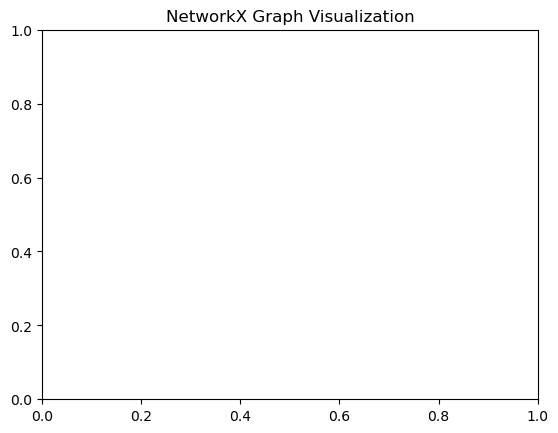

In [16]:
# Draw the graph using matplotlib
pos = nx.spring_layout(class_reference_graph)  # You can choose a different layout algorithm
plt.title("NetworkX Graph Visualization")
plt.figure(figsize=(200, 200), dpi=200)
nx.draw_networkx(class_reference_graph, pos, with_labels=True, node_color='lightblue', node_size=50, font_size=8, font_color='black')
plt.show()